# Geo Experimentation via Time Based Regression in PyMC

## Prepare Notebook

In [1]:
import arviz as az
from datetime import datetime
from itertools import chain
import matplotlib.pyplot as plt
import matplotlib.ticker as mtick
import numpy as np
import numpy.typing as npt
import pandas as pd
import pymc as pm
import pymc.sampling_jax
from sklearn.preprocessing import StandardScaler 
import seaborn as sns
from tqdm.notebook import tqdm
from xarray import DataArray, Dataset


plt.style.use("bmh")
plt.rcParams["figure.figsize"] = [10, 6]
plt.rcParams["figure.dpi"] = 100
plt.rcParams["figure.facecolor"] = "white"

%load_ext autoreload
%autoreload 2
%config InlineBackend.figure_format = "retina"

/Users/juanitorduz/.local/share/virtualenvs/website_projects-1IZj_WTw/lib/python3.10/site-packages/pymc/sampling/jax.py:37: UserWarning: This module is experimental.
  warnings.warn("This module is experimental.")


## Read Data

In [2]:
data_df = pd.read_csv("../data/zipcodes_data.csv", parse_dates=["date"])


[Text(0.5, 1.0, 'Orders per day per zipcode'),
 Text(0.5, 0, 'date'),
 Text(0, 0.5, 'orders')]

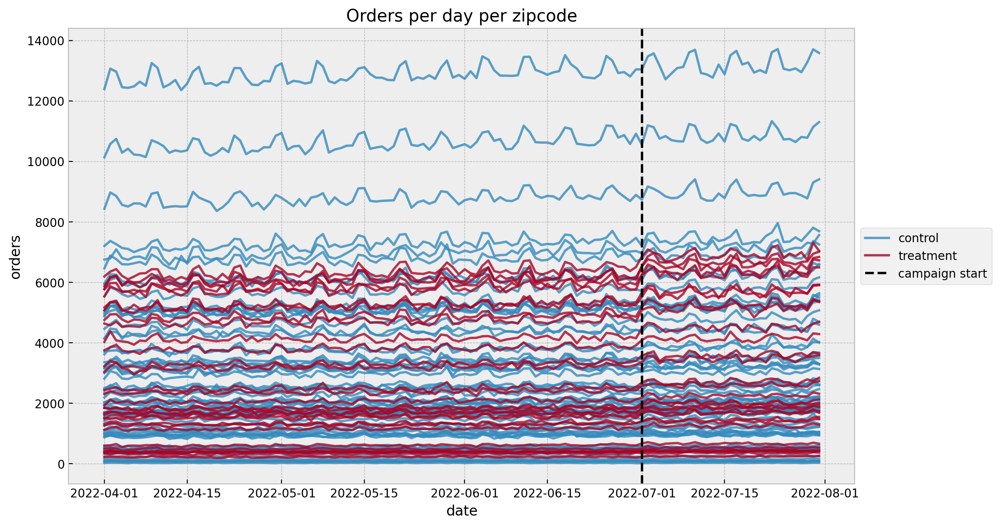

In [3]:
start_campaign = datetime(2022, 7, 1)

fig, ax = plt.subplots(figsize=(12, 7))

for i, variant in enumerate(["control", "treatment"]):
    for j, (_, df) in enumerate(
        data_df.query("variant == @variant").groupby("zipcode")
    ):
        label = variant if j == 0 else None
        sns.lineplot(
            x="date", y="orders", data=df, color=f"C{i}", alpha=0.8, label=label, ax=ax
        )

ax.axvline(x=start_campaign, color="black", linestyle="--", label="campaign start")
ax.legend(loc="center left", bbox_to_anchor=(1, 0.5))
ax.set(title="Orders per day per zipcode", xlabel="date", ylabel="orders")

## Prepare Data

In [4]:
agg_data_df = data_df.groupby(["date", "is_campaign", "variant"], as_index=False).agg(
    {"orders": np.sum}
)

data_train = (
    agg_data_df.query("~ is_campaign")
    .pivot(index="date", columns="variant", values="orders")
    .reset_index()
)

data_test = (
    agg_data_df.query("is_campaign")
    .pivot(index="date", columns="variant", values="orders")
    .reset_index()
)

In [5]:
date_train = data_train["date"].to_numpy()
y_control_train = data_train["control"].to_numpy()
y_treatment_train = data_train["treatment"].to_numpy()

date_test = data_test["date"].to_numpy()
y_control_test = data_test["control"].to_numpy()
y_treatment_test = data_test["treatment"].to_numpy()

n_train = data_train.shape[0]
n_test = data_test.shape[0]
n = n_train + n_test
idx_train = range(n_train)
idx_test = range(n_train, n)

# weighted linear regression: https://discourse.pymc.io/t/how-to-add-weights-to-data-in-bayesian-linear-regression/8362
w_train = np.linspace(start=0.8, stop=1, num=n_train)
w_train = np.ones(shape=n_train)
w_test = np.ones(shape=n_test)


In [6]:
scaler_control = StandardScaler()
scaler_treatment = StandardScaler()

scaler_control.fit(X=y_control_train[..., None])
scaler_treatment.fit(X=y_treatment_train[..., None])

y_control_train_scaled = scaler_control.transform(
    X=y_control_train[..., None]
).flatten()
y_treatment_train_scaled = scaler_treatment.transform(
    X=y_treatment_train[..., None]
).flatten()

y_control_test_scaled = scaler_control.transform(X=y_control_test[..., None]).flatten()
y_treatment_test_scaled = scaler_treatment.transform(
    X=y_treatment_test[..., None]
).flatten()

[Text(0.5, 1.0, 'Orders (Scaled)')]

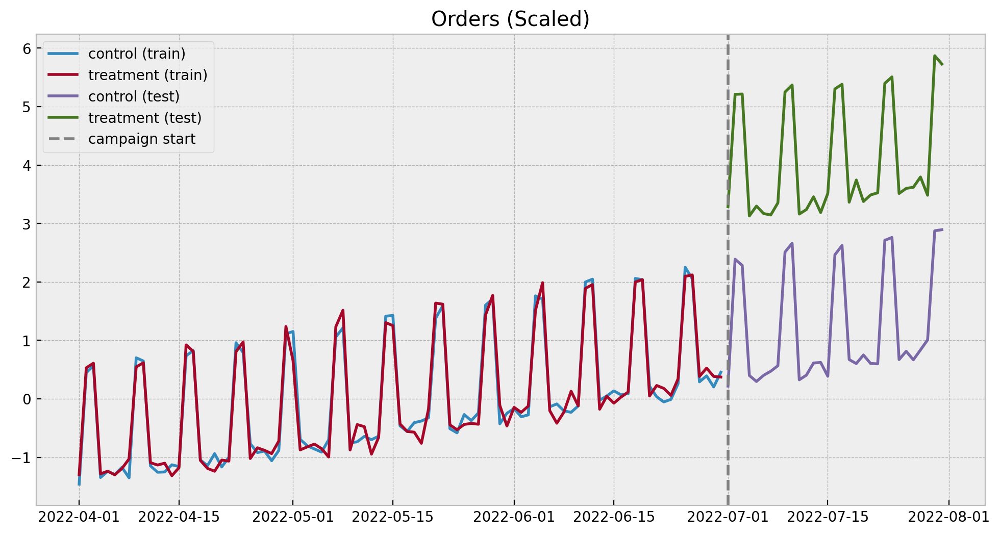

In [7]:
fig, ax = plt.subplots(figsize=(12, 6))
sns.lineplot(
    x=date_train, y=y_control_train_scaled, color="C0", label="control (train)", ax=ax
)
sns.lineplot(
    x=date_train,
    y=y_treatment_train_scaled,
    color="C1",
    label="treatment (train)",
    ax=ax,
)
sns.lineplot(
    x=date_test, y=y_control_test_scaled, color="C2", label="control (test)", ax=ax
)
sns.lineplot(
    x=date_test,
    y=y_treatment_test_scaled,
    color="C3",
    label="treatment (test)",
    ax=ax,
)
ax.axvline(x=start_campaign, color="gray", linestyle="--", label="campaign start")
ax.legend(loc="upper left")
ax.set(title="Orders (Scaled)")

## Define Model

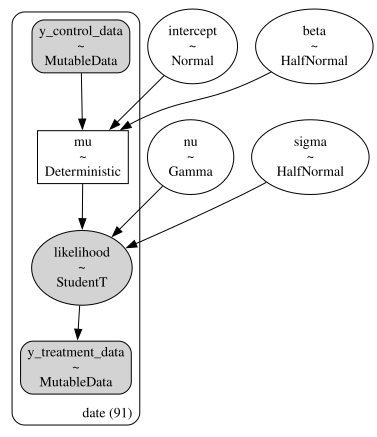

In [8]:
with pm.Model() as model:
    # --- Data Containers ---
    model.add_coord(name="date", values=date_train, mutable=True)
    y_control_data = pm.MutableData(
        name="y_control_data", value=y_control_train_scaled, dims="date"
    )
    y_treatment_data = pm.MutableData(
        name="y_treatment_data", value=y_treatment_train_scaled, dims="date"
    )
    # --- Priors ---
    intercept = pm.Normal(name="intercept", mu=0, sigma=1)
    beta = pm.HalfNormal(name="beta", sigma=2)
    sigma = pm.HalfNormal(name="sigma", sigma=2)
    nu = pm.Gamma(name="nu", alpha=20, beta=2)
    # --- Model Parametrization ---
    mu = pm.Deterministic(name="mu", var=intercept + beta * y_control_data, dims="date")
    # --- Likelihood ---
    likelihood = pm.StudentT(
        "likelihood", mu=mu, nu=nu, sigma=sigma, observed=y_treatment_data, dims="date"
    )

pm.model_to_graphviz(model=model)


## Prior Predictive Check

In [9]:
with model:
    prior_predictive = pm.sample_prior_predictive(samples=1000)


Sampling: [beta, intercept, likelihood, nu, sigma]
INFO:pymc:Sampling: [beta, intercept, likelihood, nu, sigma]


[Text(0.5, 1.0, 'Prior Predictive Samples'),
 Text(0.5, 0, 'date'),
 Text(0, 0.5, 'orders (scaled)')]

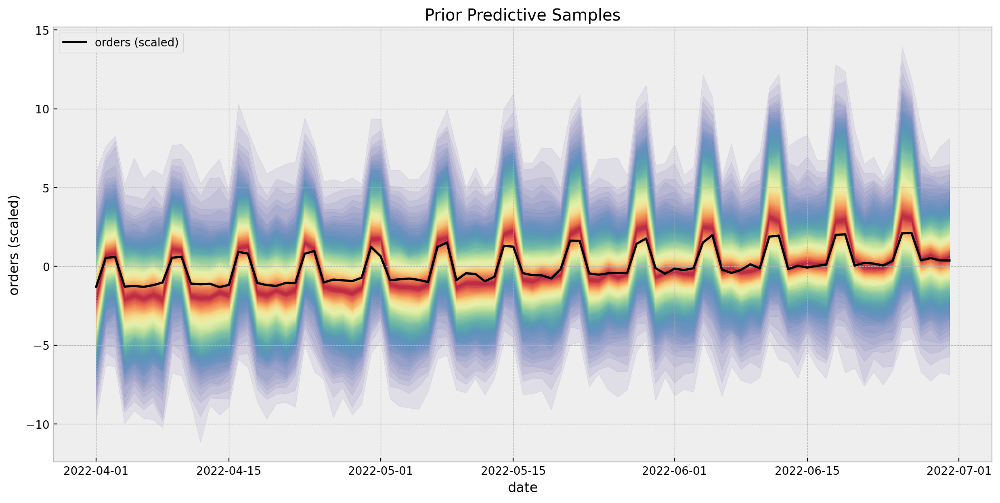

In [10]:
palette = "Spectral_r"
cmap = plt.get_cmap(palette)
percs = np.linspace(51, 99, 100)
colors = (percs - np.min(percs)) / (np.max(percs) - np.min(percs))


fig, ax = plt.subplots(figsize=(15, 7))

for i, p in enumerate(percs[::-1]):
    upper = np.percentile(prior_predictive.prior_predictive["likelihood"], p, axis=1)
    lower = np.percentile(
        prior_predictive.prior_predictive["likelihood"], 100 - p, axis=1
    )
    color_val = colors[i]
    ax.fill_between(
        x=date_train,
        y1=upper.flatten(),
        y2=lower.flatten(),
        color=cmap(color_val),
        alpha=0.1,
    )

sns.lineplot(
    x=date_train,
    y=y_treatment_train_scaled,
    label="orders (scaled)",
    color="black",
    ax=ax,
)
ax.legend(loc="upper left")
ax.set(
    title=f"Prior Predictive Samples",
    xlabel="date",
    ylabel=f"orders (scaled)",
)

## Fit Model

In [11]:
with model:
    idata = pm.sampling_jax.sample_numpyro_nuts(draws=5000, chains=4)
    posterior_predictive = pm.sample_posterior_predictive(trace=idata)


Compiling...
Compilation time =  0:00:02.401902
Sampling...


  0%|          | 0/6000 [00:00<?, ?it/s]

  0%|          | 0/6000 [00:00<?, ?it/s]

  0%|          | 0/6000 [00:00<?, ?it/s]

  0%|          | 0/6000 [00:00<?, ?it/s]

Sampling time =  0:00:04.320031
Transforming variables...
Transformation time =  0:00:00.171452
Computing Log Likelihood...


Sampling: [likelihood]
INFO:pymc:Sampling: [likelihood]


Log Likelihood time =  0:00:00.988520


## Model Diagnostics

In [12]:
var_names = [
    "intercept",
    "beta",
    "sigma",
    "nu",
]


In [13]:
az.summary(data=idata, var_names=var_names)


,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
intercept,0.003,0.018,-0.031,0.037,0.000,0.000,22358.0,15311.0,1.0
beta,0.985,0.018,0.952,1.019,0.000,0.000,22084.0,15641.0,1.0
sigma,0.157,0.014,0.132,0.183,0.000,0.000,18100.0,14662.0,1.0
nu,10.351,2.191,6.425,14.528,0.015,0.011,19772.0,13897.0,1.0


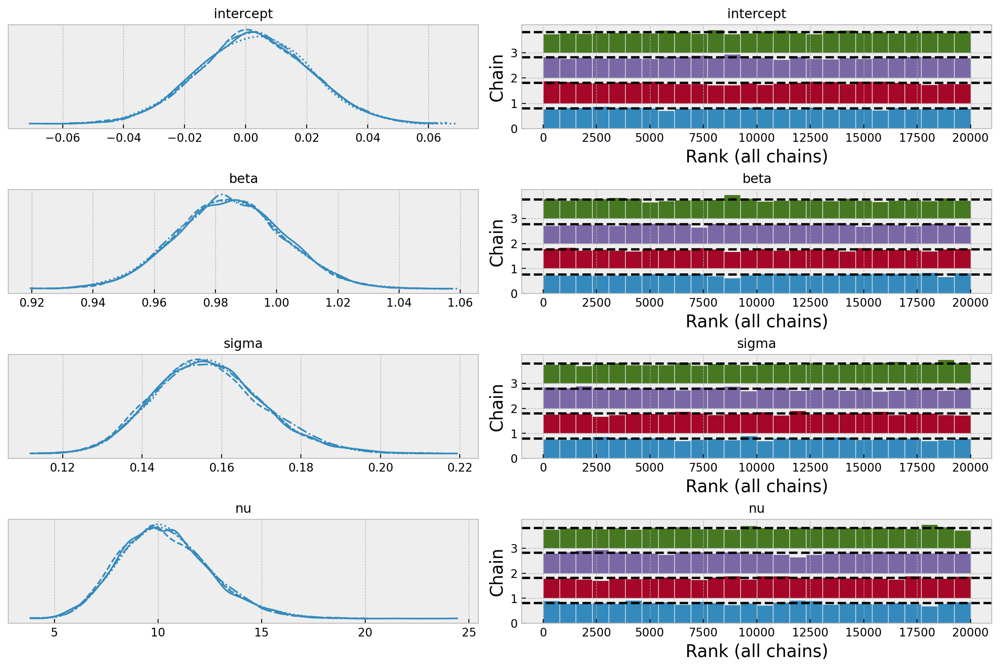

In [14]:
axes = az.plot_trace(
    data=idata,
    var_names=var_names,
    compact=True,
    kind="rank_bars",
    backend_kwargs={"figsize": (12, 8), "layout": "constrained"},
)


## Posterior Predictive (Train)

[Text(0.5, 1.0, 'Posterior Predictive Samples (Train)- Orders (Scaled)'),
 Text(0.5, 0, 'date'),
 Text(0, 0.5, 'orders (scaled)')]

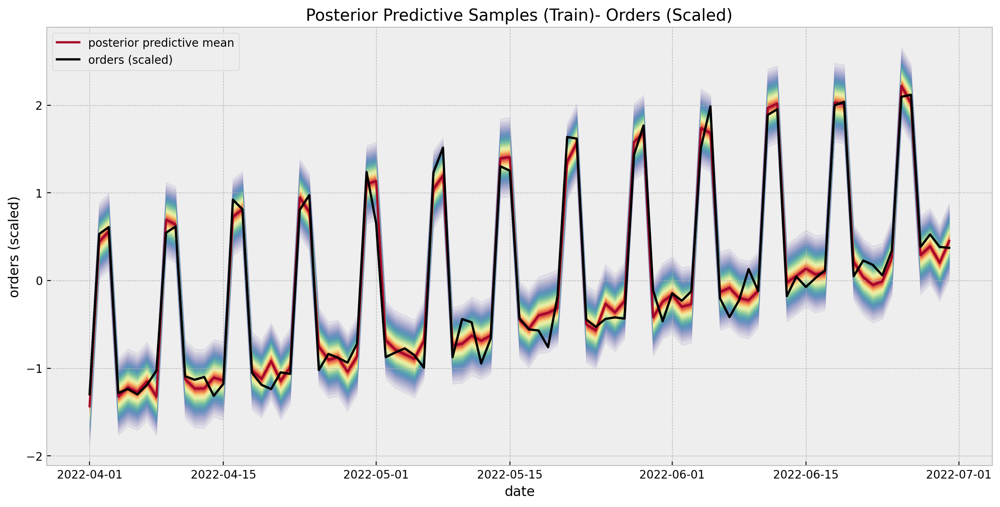

In [15]:
posterior_predictive_likelihood_train = az.extract(
    data=posterior_predictive, group="posterior_predictive", var_names=["likelihood"]
)

fig, ax = plt.subplots(figsize=(15, 7))

for i, p in enumerate(percs[::-1]):
    upper = np.percentile(posterior_predictive_likelihood_train, p, axis=1)
    lower = np.percentile(posterior_predictive_likelihood_train, 100 - p, axis=1)
    color_val = colors[i]
    ax.fill_between(
        x=date_train,
        y1=upper,
        y2=lower,
        color=cmap(color_val),
        alpha=0.1,
    )

sns.lineplot(
    x=date_train,
    y=posterior_predictive_likelihood_train.mean(axis=1),
    color="C1",
    label="posterior predictive mean",
    ax=ax,
)
sns.lineplot(
    x=date_train,
    y=y_treatment_train_scaled,
    color="black",
    label="orders (scaled)",
    ax=ax,
)
ax.legend(loc="upper left")
ax.set(
    title=f"Posterior Predictive Samples (Train)- Orders (Scaled)",
    xlabel="date",
    ylabel=f"orders (scaled)",
)

[Text(0.5, 1.0, 'Posterior Errors Distribution (Train)'),
 Text(0.5, 0, 'date'),
 Text(0, 0.5, '$\\hat{y} - y$')]

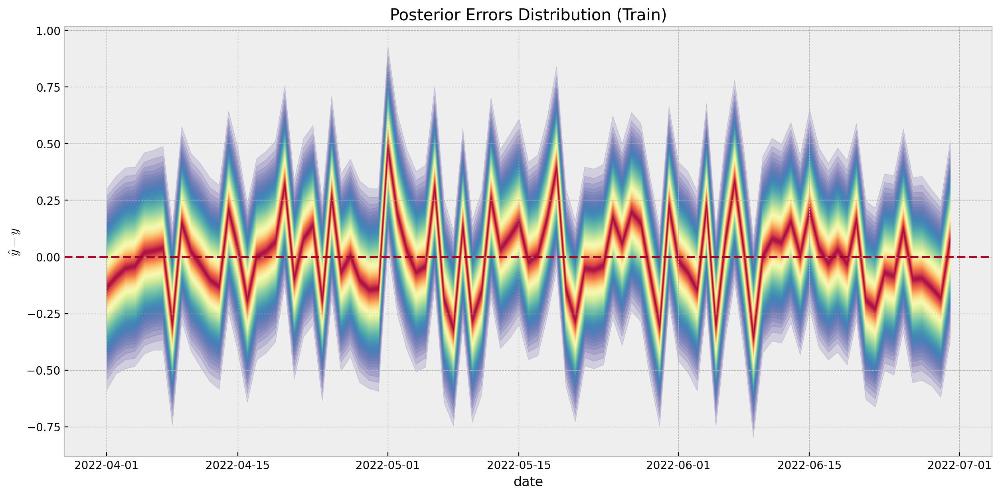

In [16]:
errors_train = (
    posterior_predictive_likelihood_train - y_treatment_train_scaled[..., None]
)

errors_train_inv = (
    scaler_treatment.inverse_transform(X=posterior_predictive_likelihood_train)
    - y_treatment_train[..., None]
)

fig, ax = plt.subplots(figsize=(15, 7))

for i, p in enumerate(percs[::-1]):
    upper = np.percentile(a=errors_train, q=p, axis=1)
    lower = np.percentile(a=errors_train, q=100 - p, axis=1)
    color_val = colors[i]
    ax.fill_between(x=date_train, y1=upper, y2=lower, color=cmap(color_val), alpha=0.2)

ax.axhline(y=0, color="C1", linestyle="--")
ax.set(
    title="Posterior Errors Distribution (Train)",
    xlabel="date",
    ylabel=r"$\hat{y} - y$",
)

## Uncertainty Quantification

In [17]:
def generate_folds_indices(n_train: int, n_test: int) -> npt.NDArray[np.int_]:
    """Generate cyclic folds indices."""
    return np.array(
        [np.arange(start=i, stop=i + n_test) % n_train for i in range(n_train)]
    )


folds_indices: npt.NDArray[np.int_] = generate_folds_indices(n_train=n_train, n_test=n_test)

folds_indices

array([[ 0,  1,  2, ..., 28, 29, 30],
       [ 1,  2,  3, ..., 29, 30, 31],
       [ 2,  3,  4, ..., 30, 31, 32],
       ...,
       [88, 89, 90, ..., 25, 26, 27],
       [89, 90,  0, ..., 26, 27, 28],
       [90,  0,  1, ..., 27, 28, 29]])

In [18]:
folds_errors_list: list[npt.NDArray[np.float_]] = []
# generate prediction for each fold and compute the errors (original scale).
for i in tqdm(range(n_train)):
    idx = folds_indices[i, :]
    likelihood_fold = posterior_predictive_likelihood_train[idx, :]
    y_control_fold_scaled_pred = scaler_control.inverse_transform(X=likelihood_fold)
    y_control_fold_scaled = y_control_train[idx]
    error_control_fold = y_control_fold_scaled[..., None] - y_control_fold_scaled_pred
    folds_errors_list.append(error_control_fold)

folds_errors = np.array(folds_errors_list)

# compute the HDI and the median across folds.
folds_hdi = az.hdi(ary=np.moveaxis(a=folds_errors, source=0, destination=2))
folds_hdi_median = np.median(a=folds_hdi, axis=0)


  0%|          | 0/91 [00:00<?, ?it/s]

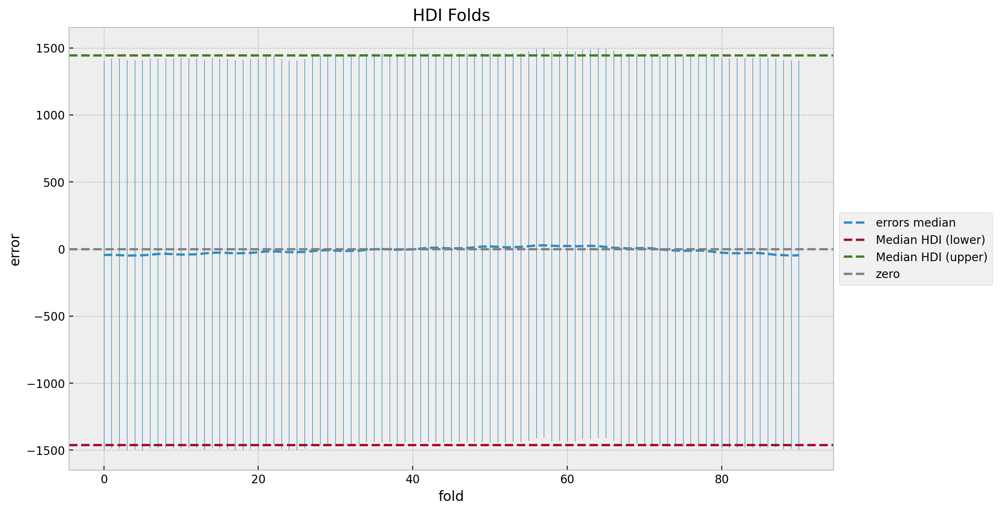

In [19]:
fig, ax = plt.subplots(figsize=(12, 7))

for i in range(n_train):
    ax.vlines(
        x=i,
        ymin=folds_hdi[i, 0],
        ymax=folds_hdi[i, 1],
        linestyle="solid",
        linewidth=0.5,
    )
ax.plot(
    np.median(folds_errors.reshape(n_train, -1), axis=1),
    color="C0",
    linestyle="dashed",
    label="errors median",
)
ax.axhline(
    y=folds_hdi_median[0], color="C1", linestyle="dashed", label="Median HDI (lower)"
)
ax.axhline(
    y=folds_hdi_median[1], color="C3", linestyle="dashed", label="Median HDI (upper)"
)
ax.axhline(y=0.0, color="gray", linestyle="--", label="zero")
ax.legend(loc="center left", bbox_to_anchor=(1, 0.5))
ax.set(title="HDI Folds", xlabel="fold", ylabel="error");

In [20]:
folds_errors_cumsum = folds_errors.cumsum(axis=1)
folds_cumsum_hdi = az.hdi(ary=np.moveaxis(a=folds_errors_cumsum, source=0, destination=2))
folds_cumsum_hdi_median = np.median(a=folds_cumsum_hdi, axis=0)

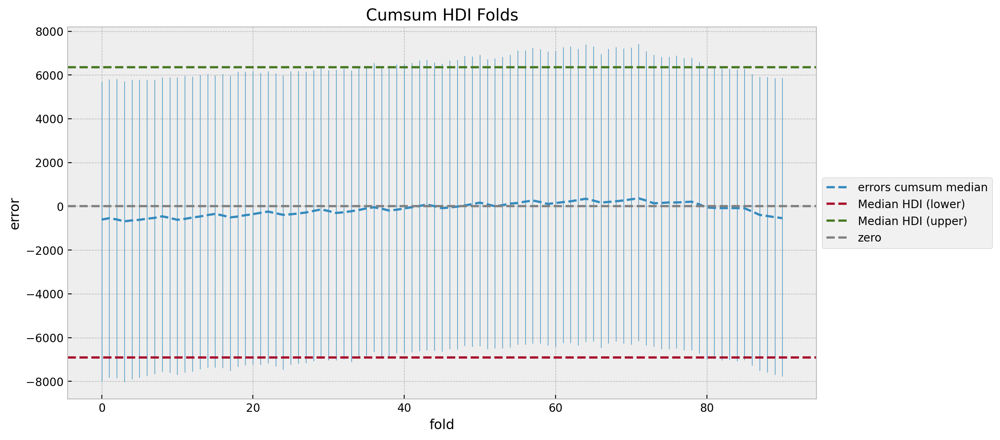

In [21]:
median_folds_errors_cumsum = np.median(folds_errors_cumsum.reshape(n_train, -1), axis=1)


fig, ax = plt.subplots(figsize=(12, 6))

for i in range(n_train):
    ax.vlines(
        x=i,
        ymin=folds_cumsum_hdi[i, 0],
        ymax=folds_cumsum_hdi[i, 1],
        linestyle="solid",
        linewidth=0.5,
    )
ax.plot(
    median_folds_errors_cumsum,
    color="C0",
    linestyle="dashed",
    label="errors cumsum median",
)
ax.axhline(
    y=folds_cumsum_hdi_median[0],
    color="C1",
    linestyle="dashed",
    label="Median HDI (lower)",
)
ax.axhline(
    y=folds_cumsum_hdi_median[1],
    color="C3",
    linestyle="dashed",
    label="Median HDI (upper)",
)
ax.axhline(y=0.0, color="gray", linestyle="--", label="zero")
ax.legend(loc="center left", bbox_to_anchor=(1, 0.5))
ax.set(title="Cumsum HDI Folds", xlabel="fold", ylabel="error");

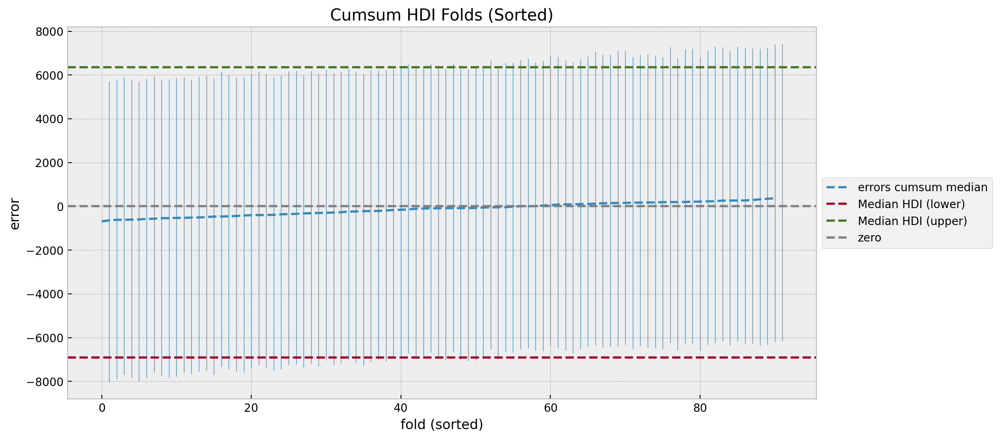

In [22]:
sorted_idx = np.argsort(a=median_folds_errors_cumsum)


fig, ax = plt.subplots(figsize=(12, 6))

for i in range(n_train):
    ymin = folds_cumsum_hdi[sorted_idx][i, 0]
    ymax = folds_cumsum_hdi[sorted_idx][i, 1]
    outside_condition = (ymin < folds_cumsum_hdi_median[0]) or (
        ymax > folds_cumsum_hdi_median[1]
    )
    ax.vlines(
        x=i + 1,
        ymin=ymin,
        ymax=ymax,
        color="C0",
        linestyle="solid",
        linewidth=0.5,
    )
ax.plot(
    median_folds_errors_cumsum[sorted_idx],
    color="C0",
    linestyle="dashed",
    label="errors cumsum median",
)
ax.axhline(
    y=folds_cumsum_hdi_median[0],
    color="C1",
    linestyle="dashed",
    label="Median HDI (lower)",
)
ax.axhline(
    y=folds_cumsum_hdi_median[1],
    color="C3",
    linestyle="dashed",
    label="Median HDI (upper)",
)
ax.axhline(y=0.0, color="gray", linestyle="--", label="zero")
ax.legend(loc="center left", bbox_to_anchor=(1, 0.5))
ax.set(title="Cumsum HDI Folds (Sorted)", xlabel="fold (sorted)", ylabel="error");

## Posterior Predictive (Test)

In [23]:
with model:
    pm.set_data(
        new_data={
            "y_control_data": y_control_test_scaled,
            "y_treatment_data": y_treatment_test_scaled,
        },
        coords={"date": date_test},
    )
    idata.extend(
        pm.sample_posterior_predictive(
            trace=idata,
            var_names=["likelihood", "mu"],
            idata_kwargs={"coords": {"date": date_test}},
        )
    )


Sampling: [likelihood]
INFO:pymc:Sampling: [likelihood]


[Text(0.5, 1.0, 'Posterior Predictive Samples (Test) - Orders'),
 Text(0.5, 0, 'date'),
 Text(0, 0.5, 'orders')]

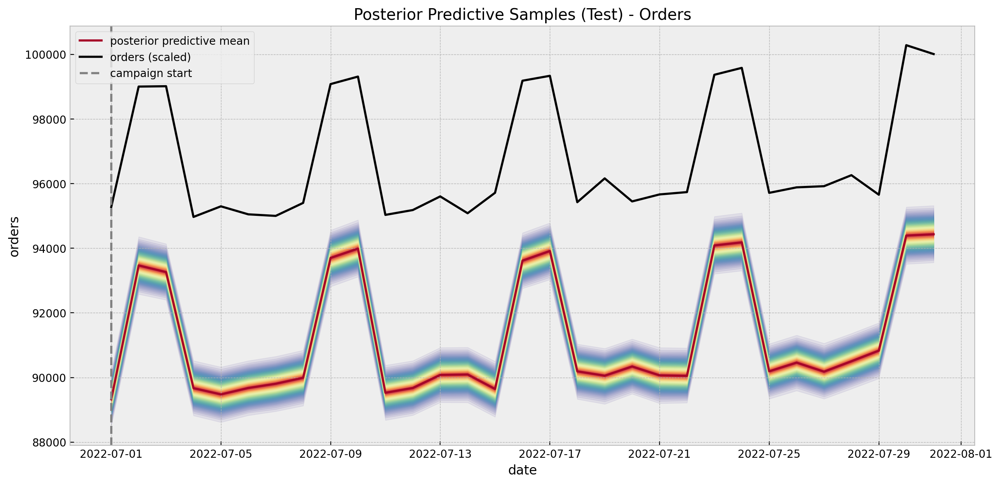

In [24]:
posterior_predictive_likelihood_test = az.extract(
    data=idata, group="posterior_predictive", var_names=["likelihood"]
)

posterior_predictive_likelihood_test_inv = scaler_treatment.inverse_transform(
    X=posterior_predictive_likelihood_test
)

fig, ax = plt.subplots(figsize=(15, 7))

for i, p in enumerate(percs[::-1]):
    upper = np.percentile(a=posterior_predictive_likelihood_test_inv, q=p, axis=1)
    lower = np.percentile(a=posterior_predictive_likelihood_test_inv, q=100 - p, axis=1)
    color_val = colors[i]
    ax.fill_between(
        x=date_test,
        y1=upper,
        y2=lower,
        color=cmap(color_val),
        alpha=0.1,
    )

sns.lineplot(
    x=date_test,
    y=posterior_predictive_likelihood_test_inv.mean(axis=1),
    color="C1",
    label="posterior predictive mean",
    ax=ax,
)
sns.lineplot(
    x=date_test,
    y=y_treatment_test,
    color="black",
    label="orders (scaled)",
    ax=ax,
)
ax.axvline(x=start_campaign, color="gray", linestyle="--", label="campaign start")
ax.legend(loc="upper left")
ax.set(
    title="Posterior Predictive Samples (Test) - Orders",
    xlabel="date",
    ylabel="orders",
)

[Text(0.5, 1.0, 'Posterior Errors Distribution (Test) - Orders'),
 Text(0.5, 0, 'date'),
 Text(0, 0.5, '$\\hat{y} - y$')]

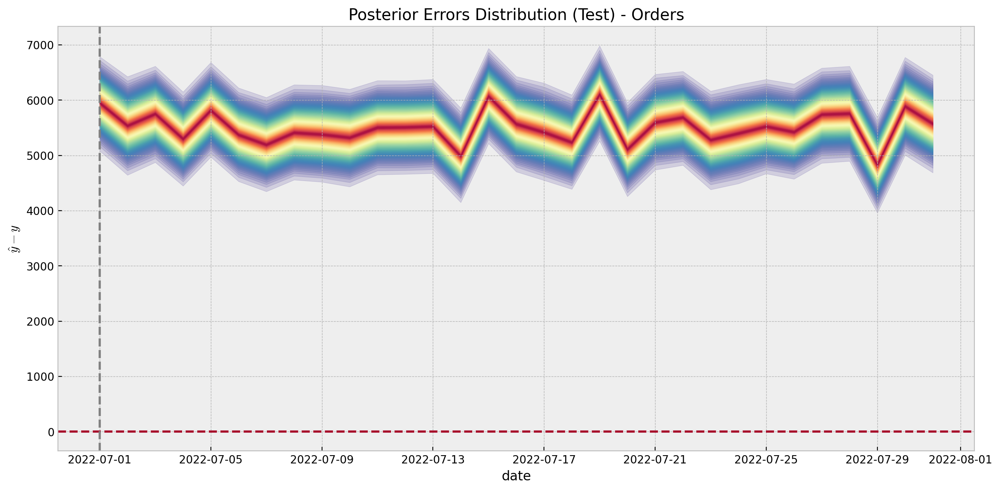

In [25]:
errors_test_inv = y_treatment_test[..., None] - posterior_predictive_likelihood_test_inv


fig, ax = plt.subplots(figsize=(15, 7))

for i, p in enumerate(percs[::-1]):
    upper = np.percentile(a=errors_test_inv, q=p, axis=1)
    lower = np.percentile(a=errors_test_inv, q=100 - p, axis=1)
    color_val = colors[i]
    ax.fill_between(x=date_test, y1=upper, y2=lower, color=cmap(color_val), alpha=0.2)

ax.axhline(y=0, color="C1", linestyle="--")
ax.axvline(x=start_campaign, color="gray", linestyle="--", label="campaign start")
ax.set(
    title="Posterior Errors Distribution (Test) - Orders",
    xlabel="date",
    ylabel=r"$\hat{y} - y$",
)

/var/folders/4r/dzmwyydj3mbggyfwbs1cklvh0000gn/T/ipykernel_70278/1639633409.py:2: FutureWarning: hdi currently interprets 2d data as (draw, shape) but this will change in a future release to (chain, draw) for coherence with other functions
  errors_test_cumsum_hdi = az.hdi(ary=errors_test_cumsum.T)[-1, :]


[Text(0.5, 1.0, 'Posterior Cumulative Errors Distribution (Test) - Orders'),
 Text(0.5, 0, 'date'),
 Text(0, 0.5, '$\\hat{y} - y$')]

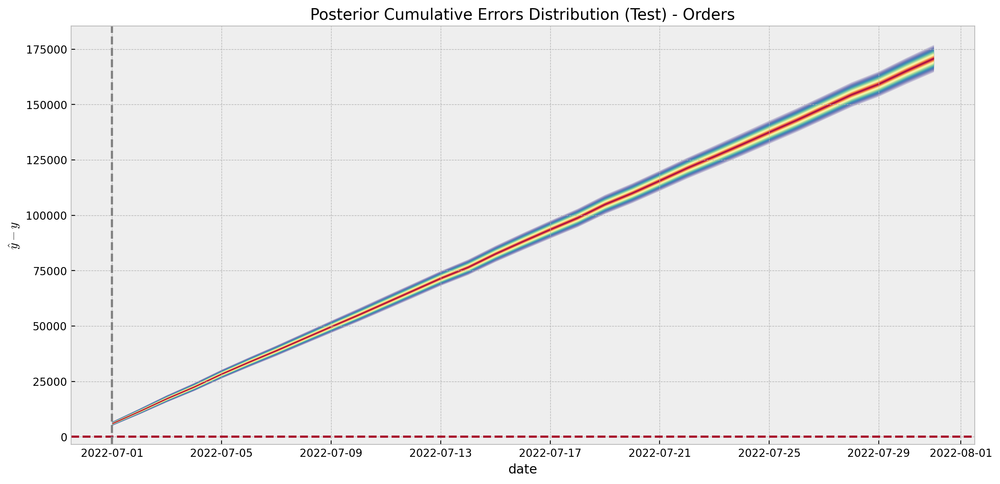

In [26]:
errors_test_cumsum = errors_test_inv.cumsum(axis=0)
errors_test_cumsum_hdi = az.hdi(ary=errors_test_cumsum.T)[-1, :]


fig, ax = plt.subplots(figsize=(15, 7))

for i, p in enumerate(percs[::-1]):
    upper = np.percentile(a=errors_test_cumsum, q=p, axis=1)
    lower = np.percentile(a=errors_test_cumsum, q=100 - p, axis=1)
    color_val = colors[i]
    ax.fill_between(x=date_test, y1=upper, y2=lower, color=cmap(color_val), alpha=0.2)

ax.axhline(y=0, color="C1", linestyle="--")
ax.axvline(x=start_campaign, color="gray", linestyle="--", label="campaign start")
ax.set(
    title="Posterior Cumulative Errors Distribution (Test) - Orders",
    xlabel="date",
    ylabel=r"$\hat{y} - y$",
)